In [1]:
import gymnasium as gym
from gymnasium import spaces
# from stable_baselines3 import PPO
# from scipy.optimize import minimize, Bounds, LinearConstraint
import plotly.graph_objs as go
import pandas as pd
import requests
import numpy as np
import yfinance as yf
import matplotlib
%matplotlib inline
import random
import plotly.io as pio
# import cvxpy as cp
# import matplotlib.pyplot as plt
import datetime as dt
# from prophet import Prophet
from sklearn.metrics import r2_score, mean_absolute_error
# from stable_baselines3.common.vec_env import DummyVecEnv
# import torch
from flipside import Flipside
from dune_client.client import DuneClient

import os
from dotenv import load_dotenv

import datetime as dt
from datetime import timedelta
import pytz  # Import pytz if using timezones

from sklearn.linear_model import LinearRegression
import tensorflow as tf
import torch

from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv

import matplotlib.pyplot as plt

from plotly.subplots import make_subplots

from diskcache import Cache


e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\pydantic\_internal\_config.py:341: UserWarning: Valid config keys have changed in V2:
* 'fields' has been removed
  warnings.warn(message, UserWarning)


In [2]:
os.chdir('..')

In [3]:
cache = Cache('classifier_results_cache')

In [4]:
from python_scripts.utils import flipside_api_results, set_random_seed, to_time, clean_prices, calculate_cumulative_return, calculate_cagr, calculate_beta, fetch_and_process_tbill_data,data_cleaning,prepare_data_for_simulation,normalize_asset_returns,calculate_sortino_ratio,pull_data,mvo,calculate_log_returns
from sql_scripts.queries import lst_portfolio_prices,eth_btc_prices,dao_advisor_portfolio, yield_portfolio_prices, token_prices, arb_stables_portfolio_prices
from models.training import train_model
from python_scripts.apis import token_classifier_portfolio
import streamlit as st
from models.rebalance import Portfolio

2025-01-19 13:39:14.519 WARNING streamlit.runtime.caching.cache_data_api: No runtime found, using MemoryCacheStorageManager
2025-01-19 13:39:14.550 WARNING streamlit.runtime.caching.cache_data_api: No runtime found, using MemoryCacheStorageManager


Current Directory: e:\Projects\portfolio_optimizers\classifier_optimizer


In [5]:
load_dotenv()
flipside_api_key = os.getenv("FLIPSIDE_API_KEY")

In [6]:
@st.cache_data(ttl=timedelta(days=7))
def fetch_and_process_tbill_data(api_url, data_key, date_column, value_column, date_format='datetime'):
    api_key = os.getenv("FRED_API_KEY")
    api_url_with_key = f"{api_url}&api_key={api_key}"

    response = requests.get(api_url_with_key)
    if response.status_code == 200:
        data = response.json()
        df = pd.DataFrame(data[data_key])
        
        if date_format == 'datetime':
            df[date_column] = pd.to_datetime(df[date_column])
        
        df.set_index(date_column, inplace=True)
        df[value_column] = df[value_column].astype(float)
        return df
    else:
        print(f"Failed to retrieve data: {response.status_code}")
        return pd.DataFrame()  # Return an empty DataFrame in case of failure
    
three_month_tbill_historical_api = "https://api.stlouisfed.org/fred/series/observations?series_id=TB3MS&file_type=json"

try:
    three_month_tbill = fetch_and_process_tbill_data(three_month_tbill_historical_api, "observations", "date", "value")
    three_month_tbill['decimal'] = three_month_tbill['value'] / 100
    current_risk_free = three_month_tbill['decimal'].iloc[-1]
    print(f"3-month T-bill data fetched: {three_month_tbill.tail()}")
except Exception as e:
    print(f"Error in fetching tbill data: {e}")


2025-01-19 13:39:14.601 WARNING streamlit.runtime.caching.cache_data_api: No runtime found, using MemoryCacheStorageManager
2025-01-19 13:39:14.989 
  command:

    streamlit run e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]
2025-01-19 13:39:14.991 No runtime found, using MemoryCacheStorageManager


3-month T-bill data fetched:            realtime_start realtime_end  value  decimal
date                                                  
2024-08-01     2025-01-09   2025-01-09   5.05   0.0505
2024-09-01     2025-01-09   2025-01-09   4.72   0.0472
2024-10-01     2025-01-09   2025-01-09   4.51   0.0451
2024-11-01     2025-01-09   2025-01-09   4.42   0.0442
2024-12-01     2025-01-09   2025-01-09   4.27   0.0427


In [7]:
def prices_data_func(network,
                     api_key,use_cached_data,name,days=None,
                     function=None,start_date=None,
                     backtest_period=None,ffill=False,dropna=True,volume_threshold=1,prices_only=False):
    
    if start_date is None and backtest_period is None and function is None:
        raise KeyError("Provide either a start date or backtest_period")
    
    if backtest_period is None and start_date is not None:
        backtest_period = (pd.to_datetime(dt.datetime.now(dt.timezone.utc)) - pd.to_datetime(start_date)).days * 24

    if function is None:

        data = token_classifier_portfolio(
            network=network,
            days=days,
            name=name,
            api_key = flipside_api_key,
            use_cached_data=use_cached_data,
            volume_threshold=volume_threshold,
            backtest_period=backtest_period,
            prices_only=prices_only
        )

        prices_df = data_cleaning(data['portfolio'],ffill=ffill,dropna=dropna)
        print(f'prices: {prices_df}') 
    else: 
        data = pull_data(function=function,start_date=start_date, path=f'data/{name}.csv', api=not use_cached_data,model_name=name)
        prices_df = data_cleaning(data['portfolio'])

    prices_df.columns = prices_df.columns.str.replace('_Price','')

    return data, prices_df

In [8]:
def classifier_results(network,model_name=None,days=60,use_cached_data=True,volume_threshold=1,backtest_period=4380,
                start_date = None,window=720,normalized_value=100, sortino_ratio_filter=False,sortino_threshold=1,top=None,seed=20,rebalance_frequency=24,training_percentage=0.75,
                dropna=True,ffill=False,ent_coef=0.01,clip_range=0.3,visualizations=False):

    if start_date is None:
        start_date_raw = dt.datetime.now() - timedelta(hours=backtest_period)
        start_date = start_date_raw.strftime('%Y-%m-%d %H:00:00')
        
    print(f'Start Date: {start_date}') #Start date used for prices function, if applicable

    if model_name is None:
        model_name = f'{network}_classifier'
        print(f'model_name: {model_name}')

    today_utc = dt.datetime.now(dt.timezone.utc) 
    formatted_today_utc = today_utc.strftime('%Y-%m-%d %H:00:00')

    # %%
    data, prices_df = prices_data_func(
        network=network, 
        days=days,
        name=model_name,
        api_key=flipside_api_key,
        use_cached_data=use_cached_data,
        function=None,
        start_date=start_date,
        backtest_period=backtest_period,
        volume_threshold=volume_threshold,
        ffill=ffill,
        dropna=dropna)
    
    prices_returns = prices_df.pct_change().dropna()
    result = calculate_sortino_ratio(prices_returns,current_risk_free,window)
    rolling_sortinos = result[0].dropna()
    sortino_ratios_ranked = result[1].sort_values(ascending = False)

    sortino_ratio_df = sortino_ratios_ranked.to_frame(
        'Sortino Ratio'
    )
    sortino_ratio_df.reset_index(inplace=True)

    price_data = data['portfolio']

    print(f'data: {data}')
    print(f'data type: {type(data)}')

    if 'classifier' in data:
        classifier_data = data['classifier']

    # %%
    if not sortino_ratio_filter and top is not None:
        sorted_by_return = classifier_data.sort_values(by='sixty_d_return',ascending=False).head(top)
        filtered_assets = sorted_by_return['symbol'].head(top).to_list()

        price_data = price_data[price_data['symbol'].isin(filtered_assets)]
        classifier_data = classifier_data[classifier_data['symbol'].isin(filtered_assets)]
        sortino_ratio_df = sortino_ratio_df[sortino_ratio_df['index'].isin(filtered_assets)]
        prices_df = prices_df[filtered_assets]
        rolling_sortinos = rolling_sortinos[filtered_assets]

    # %%
    if sortino_ratio_filter:
        
        mean_ratio = sortino_ratio_df['Sortino Ratio'].mean() * sortino_threshold
        
        if top is not None:
            filtered_assets = sortino_ratio_df[sortino_ratio_df['Sortino Ratio']>=mean_ratio]['index'].sort_values(ascending=False).head(top).to_list()
        else:
            filtered_assets = sortino_ratio_df[sortino_ratio_df['Sortino Ratio']>=mean_ratio][['Sortino Ratio','index']].sort_values(by='Sortino Ratio', ascending=False)
            filtered_assets = filtered_assets['index'].head(top).to_list()

        price_data = price_data[price_data['symbol'].isin(filtered_assets)]

        classifier_data = classifier_data[classifier_data['symbol'].isin(filtered_assets)]
            
        sortino_ratio_df = sortino_ratio_df[sortino_ratio_df['index'].isin(filtered_assets)]
        prices_df = prices_df[filtered_assets]
        rolling_sortinos = rolling_sortinos[filtered_assets]
    else:
        filtered_assets = prices_df.columns.to_list()
    
    classifier_dict = {
        "data":data,
        "prices":prices_df,
        "price data for model": price_data,
        "assets":filtered_assets,
        "sortino ratio":sortino_ratio_filter,
        "top":top,
        "run date": formatted_today_utc,
        "model":model_name,
        "rolling sortinos": rolling_sortinos,
        "classifier data": classifier_data,
        "sortino_ratio_df":sortino_ratio_df,
        "network":network   
    }

    cache.set(f'{model_name} classifier results', classifier_dict)
    
        

In [9]:
model_name = 'test_1'

classifier_results(network='arbitrum',model_name=model_name,days=7,use_cached_data=False,volume_threshold=1,backtest_period=12,
                start_date = None,window=720,normalized_value=100, sortino_ratio_filter=False,sortino_threshold=1,top=None,dropna=True,ffill=False)

2025-01-19 13:39:15.774 No runtime found, using MemoryCacheStorageManager


Start Date: 2025-01-19 01:00:00
use_cached_data: False
volume_threshold: 1
start_date: None
hours_back: 8760
Query not completed. Retrying in 30 seconds...
Beginning: '2025-01-19 05:00:00'
Query not completed. Retrying in 30 seconds...
cleaning prices
cleaned prices:                         hour  ARB_Price  WBTC_Price  WETH_Price
0   2025-01-19T05:00:00.000Z   0.779720    104692.0     3342.00
1   2025-01-19T06:00:00.000Z   0.764446    104550.0     3294.52
2   2025-01-19T07:00:00.000Z   0.761312    104487.0     3290.99
3   2025-01-19T08:00:00.000Z   0.756239    104950.0     3286.39
4   2025-01-19T09:00:00.000Z   0.754326    104884.0     3290.47
5   2025-01-19T10:00:00.000Z   0.728283    103965.0     3217.31
6   2025-01-19T11:00:00.000Z   0.724672    104773.0     3243.58
7   2025-01-19T12:00:00.000Z   0.718674    104236.0     3186.18
8   2025-01-19T13:00:00.000Z   0.698760    104303.0     3132.90
9   2025-01-19T14:00:00.000Z   0.716597    104371.0     3187.36
10  2025-01-19T15:00:00.000Z

In [10]:
model_classifier_result = cache.get(f'{model_name} classifier results')
model_classifier_result.keys()

dict_keys(['data', 'prices', 'price data for model', 'assets', 'sortino ratio', 'top', 'run date', 'model', 'rolling sortinos', 'classifier data', 'sortino_ratio_df', 'network'])

In [26]:
def main(model,rebalance_frequency,prices_df,normalized_value=100,seed=20,risk_free_annual=0.0425):

    model = PPO.load(f"AI_Models/{model}")

    env = Portfolio(prices_df, seed=seed, rebalance_frequency=rebalance_frequency,risk_free_annual=risk_free_annual)
   
    # Function to run simulation for each environment and model
    def run_simulation():
        
        states = []
        rewards = []
        actions = []
        portfolio_values = []

        # Reset the environment to get the initial state
        state, _ = env.reset(seed=seed)
        done = False

        while not done:
            action, _states = model.predict(state)
            action = action / np.sum(action) if np.sum(action) > 0 else action  # Prevent division by zero

            next_state, reward, done, truncated, info = env.step(action)

            # Store the results
            states.append(next_state.flatten())
            rewards.append(reward)
            actions.append(action.flatten())

            # Update the state
            state = next_state

        # Access the logged data as DataFrames
        states_df = env.get_states_df()
        rewards_df = env.get_rewards_df()
        actions_df = env.get_actions_df()
        portfolio_values_df = env.get_returns_df()
        composition = env.get_portfolio_composition_df()
        sortino_ratios = env.get_sortino_ratios_df()

        return states_df, rewards_df, actions_df, portfolio_values_df,composition,sortino_ratios
    
    states_df, rewards_df, actions_df, portfolio_values_df,composition,sortino_ratios = run_simulation()
    actions_df.to_csv('data/actions_df.csv')
    composition.to_csv('data/test_app_comp.csv')
    results = {
        "states_df": states_df,
        "rewards_df": rewards_df,
        "actions_df": actions_df,
        "Hourly Returns": portfolio_values_df,
        "composition":composition,
        'sortino_ratios':sortino_ratios
    }

    # Optionally, you can plot the rewards and portfolio values here for each model
    plt.plot(rewards_df['Date'], rewards_df['Reward'])
    plt.xlabel('Date')
    plt.ylabel('Reward')
    plt.title(f'Rewards over Time for {model}')
    # plt.savefig(f"plots/rewards_plot_{rebalance_frequency}.png")
    # plt.close() 

    # Access the stored DataFrames for each model
    dao_advisor_results = results["Hourly Returns"]
    dao_advisor_comp = results["composition"]

    print(f'dao_advisor_comp: {dao_advisor_comp}')
    print(f'dao_advisor_results: {dao_advisor_results}')

    dao_advisor_comp.set_index('Date',inplace=True)
    dao_advisor_comp.columns = prices_df.columns.str.replace('_Price', ' comp', regex=False)
    # dao_advisor_portfolio_values_df = dao_advisor_results["portfolio_values_df"]
    dao_advisor_results.set_index('Date', inplace=True)
    dao_advisor_portfolio_values_df = dao_advisor_results 

    optimized_weights, returns, sortino_ratio = mvo(prices_df,dao_advisor_comp,current_risk_free)

    price_returns = calculate_log_returns(prices_df)

    normalized_portfolio_value = normalized_value * (1 + returns).cumprod()
    normalized_prices = normalized_value * (1 + price_returns).cumprod()

    print(f'returns: {returns}')
    print(f'normalized_portfolio_value: {normalized_portfolio_value}')
    print(f'normalized_prices: {normalized_prices}')
    norm_df = normalized_portfolio_value.to_frame('Normalized Return')
    results['Normalized Return'] = norm_df

    return results

In [27]:
def grid_search_rebalance_frequency(model_name, rebalance_frequencies, normalized_value=100, 
                                    seed=20, training_percentage=0.75, dropna=True, ffill=False, ent_coef=0.01, clip_range=0.3,
                                    risk_free_annual=0.0425):
    """
    Perform grid search over rebalance frequencies to find the best one based on normalized portfolio value.
    """
    results = []

    for freq in rebalance_frequencies:
        print(f"Testing rebalance frequency: {freq} hours")
        print(f'model name: {model_name}')

        params = cache.get(f'{model_name} classifier results')
        filtered_assets = cache.get(f'{model_name} Assets')
        data = params['data']
        prices_df = params['prices']
        price_data = params['price data for model']
        
        # Train the model with the current rebalance frequency
        test_data, train_end_date, test_start_date = train_model(
            seed=seed, 
            prices=price_data,
            name=model_name, 
            api=False, 
            rebalance_frequency=freq, 
            training_percentage=training_percentage, 
            risk_free_annual=risk_free_annual,
            dropna=dropna,
            ffill=ffill,
            ent_coef=ent_coef,
            clip_range=clip_range
        )

        cache.set(f'{model_name} Test Start', test_start_date)
        
        # Retrieve parameters and test data
        # prices_df = prices_df[prices_df.index >= test_start_date]
        # prices_df = prices_df[filtered_assets]
        # prices_df.columns = [f"{col}_Price" for col in prices_df.columns]
        print(f'test_data: {test_data}')
        # import pdb; pdb.set_trace()
        # Run the simulation and get the normalized portfolio value
        results_dict = main(seed=seed, rebalance_frequency=freq, 
                            prices_df=test_data, model=model_name, normalized_value=normalized_value,risk_free_annual=risk_free_annual)
        
        print(f'results_dict: {results_dict}')
        
        norm_value_df = results_dict['Normalized Return']
        final_norm_value = norm_value_df.iloc[-1]["Normalized Return"]
        results.append({"rebalance_frequency": freq, "final_norm_value": final_norm_value})
    
    # Find the best rebalance frequency
    best_result = max(results, key=lambda x: x["final_norm_value"])
    print(f"Best rebalance frequency: {best_result['rebalance_frequency']} hours with final normalized value: {best_result['final_norm_value']}")
    return results, best_result

In [28]:
rebalance_frequencies = [24]

Testing rebalance frequency: 24 hours
model name: test_1
rebalance_frequency: 24
cleaning prices
cleaned prices:                         hour  ARB_Price  WBTC_Price  WETH_Price
0   2025-01-19T05:00:00.000Z   0.779720    104692.0     3342.00
1   2025-01-19T06:00:00.000Z   0.764446    104550.0     3294.52
2   2025-01-19T07:00:00.000Z   0.761312    104487.0     3290.99
3   2025-01-19T08:00:00.000Z   0.756239    104950.0     3286.39
4   2025-01-19T09:00:00.000Z   0.754326    104884.0     3290.47
5   2025-01-19T10:00:00.000Z   0.728283    103965.0     3217.31
6   2025-01-19T11:00:00.000Z   0.724672    104773.0     3243.58
7   2025-01-19T12:00:00.000Z   0.718674    104236.0     3186.18
8   2025-01-19T13:00:00.000Z   0.698760    104303.0     3132.90
9   2025-01-19T14:00:00.000Z   0.716597    104371.0     3187.36
10  2025-01-19T15:00:00.000Z   0.722361    104629.0     3213.43
11  2025-01-19T16:00:00.000Z   0.769292    106471.0     3389.73
12  2025-01-19T17:00:00.000Z   0.769916    103568.0    

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


Error during MVO computation: array must not contain infs or NaNs
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: 0
Reward: 0.0

--- Step 4 ---
Action after clipping: [0.72182566 0.         0.        ]
Current prices: [7.54326e-01 1.04884e+05 3.29047e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00253283 -0.00062907  0.00124071]
Portfolio return: -0.0006290687131399589
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'))]
comp_history:                            ARB_Price  WBTC_Price  WETH_Price
Date                                                        
2025-01-19 05:00:00+00:00        0.0         1.0         0.0
2025-01-

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.        0.5722691 0.       ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.10726126 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.         0.         0.21878986]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4008, CG iterations: 1031, optimality: 2.71e-01, constraint violation: 0.00e+00, execution time:  2.0 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0.         0.99011618 0.00988382], optimized_portfolio: None, sortino_ratio: None
Reward: -0.0

--- Step 5 ---
Action after clipping: [0.         0.17886774 0.42496857]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0.         0.99011618 0.00988382]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.00893592507041879
self.portfolio_composition_log: [(array([0.        , 0.9899447 , 0.01005528], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.99007283, 0.00992717]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.99007744, 0.00992256]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (arra

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


Error during MVO computation: array must not contain infs or NaNs
portfolio: [0.         0.89223924 0.10776076], optimized_portfolio: None, sortino_ratio: 0
Reward: 0.0

--- Step 4 ---
Action after clipping: [0.         1.         0.48473424]
Current prices: [7.54326e-01 1.04884e+05 3.29047e+03]
Portfolio: [0.         0.89223924 0.10776076]
Log returns: [-0.00253283 -0.00062907  0.00124071]
Portfolio return: -0.0004275795239247917
self.portfolio_composition_log: [(array([0.        , 0.89037526, 0.10962477], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.89163303, 0.10836697]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.89167836, 0.10832164]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0.89223924, 0.10776076]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0.        , 0.89205933, 0.10794067]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'))]
comp_history:                        

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.23 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.49096847 0.75335944]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.7054232 0.        0.4711979]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [1.        0.        0.8053978]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.59819454 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.1 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.03832562 0.77499056 0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.        0.5364329 1.       ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.6153767 0.        0.       ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.         0.74590373]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.58328295 0.         0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.648243   0.24822995 0.04255974]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [1. 1. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (arra

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.06171925 0.         0.08924963]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


Error during MVO computation: array must not contain infs or NaNs
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: 0
Reward: 0.0

--- Step 4 ---
Action after clipping: [0.5580058 0.        0.       ]
Current prices: [7.54326e-01 1.04884e+05 3.29047e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00253283 -0.00062907  0.00124071]
Portfolio return: -0.0006290687131399589
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'))]
comp_history:                            ARB_Price  WBTC_Price  WETH_Price
Date                                                        
2025-01-19 05:00:00+00:00        0.0         1.0         0.0
2025-01-19 

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.50410384 0.13368738 0.02436938]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.5975153  0.30802077 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1.,

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.7497244 0.9086495 0.       ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.98792106 0.         0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [1.         0.52512646 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array([0., 1., 0.

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.        0.        0.7430477]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')),

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.23 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [1.         0.15668955 0.9556708 ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.4 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1.,

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 61, function evaluations: 240, CG iterations: 101, optimality: 1.62e-09, constraint violation: 0.00e+00, execution time: 0.14 s.
portfolio: [0.         0.94382171 0.05617829], optimized_portfolio: [7.71355100e-08 9.99998539e-01 3.21481963e-07], sortino_ratio: 5.4139588008964825
Reward: -0.002808617295413351

--- Step 5 ---
Action after clipping: [0.        1.        0.1525948]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0.         0.94382171 0.05617829]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.009569424618531273
self.portfolio_composition_log: [(array([0.        , 0.94289356, 0.05710649], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.94358691, 0.05641309]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.94361189, 0.05638811]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0.943920

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`gtol` termination condition is satisfied.
Number of iterations: 802, function evaluations: 3280, CG iterations: 1571, optimality: 4.56e-10, constraint violation: 0.00e+00, execution time:  2.0 s.
portfolio: [0.         0.94452244 0.05547756], optimized_portfolio: [5.20821476e-08 9.99975982e-01 1.25195278e-07], sortino_ratio: -0.6044740308694341
Reward: -0.0051233980784092265

--- Step 7 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0.         0.94452244 0.05547756]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.0058440211613259435
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0.        , 0.94289356, 0.05710649], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.94358691, 0.05641309]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.94361189, 0.05638811]), Timestamp('2025-01-19 07:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [1. 0. 0.]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Times

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.5 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.55955136 0.         0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.7665611  0.00691598 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.87285084 0.         0.6855772 ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.3699462  0.24553347 0.4341218 ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.57501745 0.         0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.        0.5693085 0.       ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.         0.10578542 0.30214518]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.06512647 0.         0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 106, function evaluations: 420, CG iterations: 143, optimality: 5.75e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0.         0.95858486 0.04141514], optimized_portfolio: [3.53134096e-07 9.99998169e-01 1.55110240e-07], sortino_ratio: 8.304099515925031
Reward: -0.0045591025579034905

--- Step 5 ---
Action after clipping: [0.         0.21025828 0.06619626]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0.         0.95858486 0.04141514]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.009367403700104669
self.portfolio_composition_log: [(array([0.        , 0.95788974, 0.0421103 ], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.95840905, 0.04159095]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.95842775, 0.04157225]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0.95

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


Error during MVO computation: array must not contain infs or NaNs
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: 0
Reward: 0.0

--- Step 4 ---
Action after clipping: [0.6138414 0.        0.       ]
Current prices: [7.54326e-01 1.04884e+05 3.29047e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00253283 -0.00062907  0.00124071]
Portfolio return: -0.0006290687131399589
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'))]
comp_history:                            ARB_Price  WBTC_Price  WETH_Price
Date                                                        
2025-01-19 05:00:00+00:00        0.0         1.0         0.0
2025-01-19 

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.        0.        0.4308052]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.24 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.08746926 0.03568071]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.4 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.        0.        0.9553864]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [1. 0. 0.]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Times

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.5 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0. 1. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (arra

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.        0.3430701 0.1240347]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.4 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.49972916 0.8480642  0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.49508178 0.         0.52308476]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.         1.         0.99888074]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4000, CG iterations: 2002, optimality: 2.58e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0.         0.90872748 0.09127252], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [1. 0. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0.         0.90872748 0.09127252]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.006299204329646147
self.portfolio_composition_log: [(array([0.        , 0.906152  , 0.09384803], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.90724761, 0.09275239]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.       , 0.9072871, 0.0927129]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0.90777551, 

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


Error during MVO computation: array must not contain infs or NaNs
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: 0
Reward: 0.0

--- Step 4 ---
Action after clipping: [0.62387145 0.54108924 0.7083325 ]
Current prices: [7.54326e-01 1.04884e+05 3.29047e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00253283 -0.00062907  0.00124071]
Portfolio return: -0.0006290687131399589
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'))]
comp_history:                            ARB_Price  WBTC_Price  WETH_Price
Date                                                        
2025-01-19 05:00:00+00:00        0.0         1.0         0.0
2025-01-

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.9526717  0.15609995 0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.         0.06836209]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.7643778 0.        0.       ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+000

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.24 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.46760198 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array([0., 1., 0.

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.         0.28542727 0.03701559]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.23 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0. 0. 0.]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
Action is zero. Defaulting to the last portfolio composition.
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [1. 1. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (arra

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.21 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.         0.40066054]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.31718928 0.         0.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 390, function evaluations: 1552, CG iterations: 414, optimality: 1.42e-09, constraint violation: 0.00e+00, execution time:  0.8 s.
portfolio: [0.         0.96375141 0.03624859], optimized_portfolio: [9.85595658e-08 9.99998245e-01 3.06862379e-07], sortino_ratio: 9.514710598703124
Reward: -0.005321339537274027

--- Step 5 ---
Action after clipping: [0.         0.19210264 1.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0.         0.96375141 0.03624859]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.009296704016878562
self.portfolio_composition_log: [(array([0.        , 0.96313965, 0.03686037], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.96359669, 0.03640331]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.96361315, 0.03638685]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0.96

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`gtol` termination condition is satisfied.
Number of iterations: 778, function evaluations: 3200, CG iterations: 1562, optimality: 2.22e-09, constraint violation: 0.00e+00, execution time:  1.8 s.
portfolio: [0.         0.96421297 0.03578703], optimized_portfolio: [1.08643234e-06 9.99912729e-01 2.68165711e-06], sortino_ratio: -0.2832149690349024
Reward: -0.0024737472872875498

--- Step 7 ---
Action after clipping: [0.31202215 1.         1.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0.         0.96421297 0.03578703]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.00559362834801853
self.portfolio_composition_log: [(array([0.        , 0.96313965, 0.03686037], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.96359669, 0.03640331]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.        , 0.96361315, 0.03638685]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 27, function evaluations: 88, CG iterations: 26, optimality: 1.31e-09, constraint violation: 0.00e+00, execution time: 0.05 s.
portfolio: [0.         0.90210611 0.09789389], optimized_portfolio: [9.99833392e-01 1.28813496e-04 9.99149574e-03], sortino_ratio: -1.8203229759472834
Reward: 0.01804267275001797

--- Step 8 ---
Action after clipping: [0.46027908 0.4856768  0.6469254 ]
Current prices: [6.98760e-01 1.04303e+05 3.13290e+03]
Portfolio: [0.         0.90210611 0.09789389]
Log returns: [-0.02810051  0.00064257 -0.01686361]
Portfolio return: -0.001071182371939608
self.portfolio_composition_log: [(array([0.        , 0.8982076 , 0.10179234], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0.        , 0.89938575, 0.10061425]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0.       , 0.8994282, 0.1005718]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0.        , 0.89995345,

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


Error during MVO computation: array must not contain infs or NaNs
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: 0
Reward: 0.0

--- Step 4 ---
Action after clipping: [0.38338575 0.         0.        ]
Current prices: [7.54326e-01 1.04884e+05 3.29047e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00253283 -0.00062907  0.00124071]
Portfolio return: -0.0006290687131399589
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'))]
comp_history:                            ARB_Price  WBTC_Price  WETH_Price
Date                                                        
2025-01-19 05:00:00+00:00        0.0         1.0         0.0
2025-01-

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.2 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0. 1. 0.]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (arra

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.22 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.         0.34960815 0.5840061 ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array([0., 1., 0.

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.5 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.         1.         0.26523602]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC'

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.24 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [0.6395863 0.        1.       ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (array([0., 1., 0.]),

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.        0.        0.3890696]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.]), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')),

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.23 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [1.         0.7361432  0.02650682]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.3 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [0.76223046 0.0806355  1.        ]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


`gtol` termination condition is satisfied.
Number of iterations: 99, function evaluations: 388, CG iterations: 151, optimality: 2.43e-09, constraint violation: 0.00e+00, execution time: 0.23 s.
portfolio: [0. 1. 0.], optimized_portfolio: [6.85804582e-08 9.99997551e-01 1.11770440e-07], sortino_ratio: 22.183393406287855
Reward: -0.0139548779162865

--- Step 5 ---
Action after clipping: [1.         0.18800053 0.        ]
Current prices: [7.28283e-01 1.03965e+05 3.21731e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.03513493 -0.00880067 -0.02248481]
Portfolio return: -0.008800673515444314
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+0000', tz='UTC')), (ar

e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 4108, CG iterations: 2146, optimality: 2.05e-02, constraint violation: 0.00e+00, execution time:  2.4 s.
Optimization failed: The maximum number of function evaluations is exceeded.
portfolio: [0. 1. 0.], optimized_portfolio: None, sortino_ratio: None
Reward: 0.0

--- Step 7 ---
Action after clipping: [1.         0.         0.63633835]
Current prices: [7.18674e-01 1.04236e+05 3.18618e+03]
Portfolio: [0. 1. 0.]
Log returns: [-0.00831129 -0.00513855 -0.01785495]
Portfolio return: -0.005138546011011926
self.portfolio_composition_log: [(array([0., 1., 0.], dtype=float32), Timestamp('2025-01-19 05:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 06:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 07:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 08:00:00+0000', tz='UTC')), (array([0., 1., 0.]), Timestamp('2025-01-19 09:00:00+

e:\Projects\portfolio_optimizers\classifier_optimizer\python_scripts\utils.py:654: RuntimeWarning: divide by zero encountered in scalar divide
  return -annual_portfolio_return / portfolio_annual_downside_deviation
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
e:\Projects\steth_optimizer\steth_optimizer\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`xtol` termination condition is satisfied.
Number of iterations: 128, function evaluations: 128, CG iterations: 346, optimality: 8.79e+68, constraint violation: 0.00e+00, execution time:  0.2 s.
returns: 2025-01-19 16:00:00+00:00    0.053411
Name: Portfolio_Return, dtype: float64
normalized_portfolio_value: 2025-01-19 16:00:00+00:00    105.341137
Name: Portfolio_Return, dtype: float64
normalized_prices:                             ARB_Price  WBTC_Price  WETH_Price
hour                                                         
2025-01-19 15:00:00+00:00  100.000000  100.000000  100.000000
2025-01-19 16:00:00+00:00  106.294560  101.745189  105.341137
2025-01-19 17:00:00+00:00  106.380744   98.932520  104.005110
results_dict: {'states_df': Empty DataFrame
Columns: [ARB_Price, WBTC_Price, WETH_Price, Date]
Index: [], 'rewards_df':    Reward                      Date
0     0.0 2025-01-19 15:00:00+00:00
1     0.0 2025-01-19 16:00:00+00:00, 'actions_df':    ARB_weight  WBTC_weight  WETH_weight 

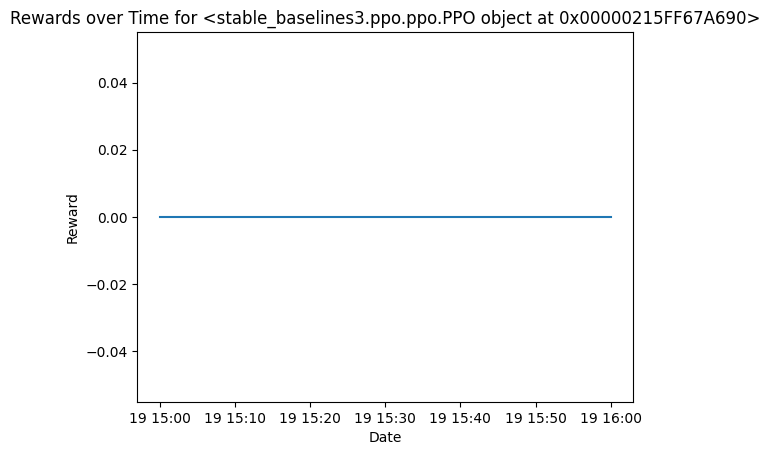

In [29]:
results, best_result = grid_search_rebalance_frequency(
        model_name=model_name,
        rebalance_frequencies=rebalance_frequencies,
        normalized_value=100,
        seed=20,
        risk_free_annual=current_risk_free
    )
    
# Print all results
for result in results:
    print(f"Rebalance Frequency: {result['rebalance_frequency']} hours, Final Normalized Value: {result['final_norm_value']}")

print(f"Optimal rebalance frequency: {best_result['rebalance_frequency']} hours")

# Update cache with the best rebalance frequency
best_rebalance_frequency = best_result['rebalance_frequency']

In [31]:
# Write the updated train_dict back to the cache
cache.set(f'{model_name} rebalance_frequency', best_rebalance_frequency)
print(f"Updated cache for {model_name} with best rebalance frequency: {best_rebalance_frequency} hours")

Updated cache for test_1 with best rebalance frequency: 24 hours


In [ ]:
if __name__ == "__main__":
    # Define parameters
    model_name = 'v0.2'
    function = None
    rebalance_frequencies = [24, 48, 72, 96, 120, 360]  # List of rebalance frequencies in hours
    network = 'arbitrum'
    days = 7
    seed = 20
    normalized_value = 100
    volume_threshold = 0.01
    backtest_period = 4380